In [1]:
import torch
import numpy as np 
import matplotlib.pyplot as plt 
from matplotlib.ticker import FuncFormatter
import seaborn as sns
import pandas as pd

from kan import create_dataset, KAN, KANLayer
from kan.MLP import MLP

from sklearn.metrics import root_mean_squared_error, mean_absolute_error, r2_score
import shap


from source import plot_f_2d, plot_f_3d, scatter_prediction_kan, kan_summary_after_fit
from source import lmdKANLayer, lmdKAN, importance_analyse_lmdKAN


device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cpu


c:\Users\Gavriil\VS_projects\lambda_KAN\.venv\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


-----
-----
## $f_2(x_1, x_2)$

##### $f_2(x_1, x_2) = \sin(\pi \cdot (x_1 \cdot x_2 + \tanh(x_1^2+x_2^2)))$

c:\Users\Gavriil\VS_projects\lambda_KAN\.venv\lib\site-packages\torch\functional.py:507: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\native\TensorShape.cpp:3550.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


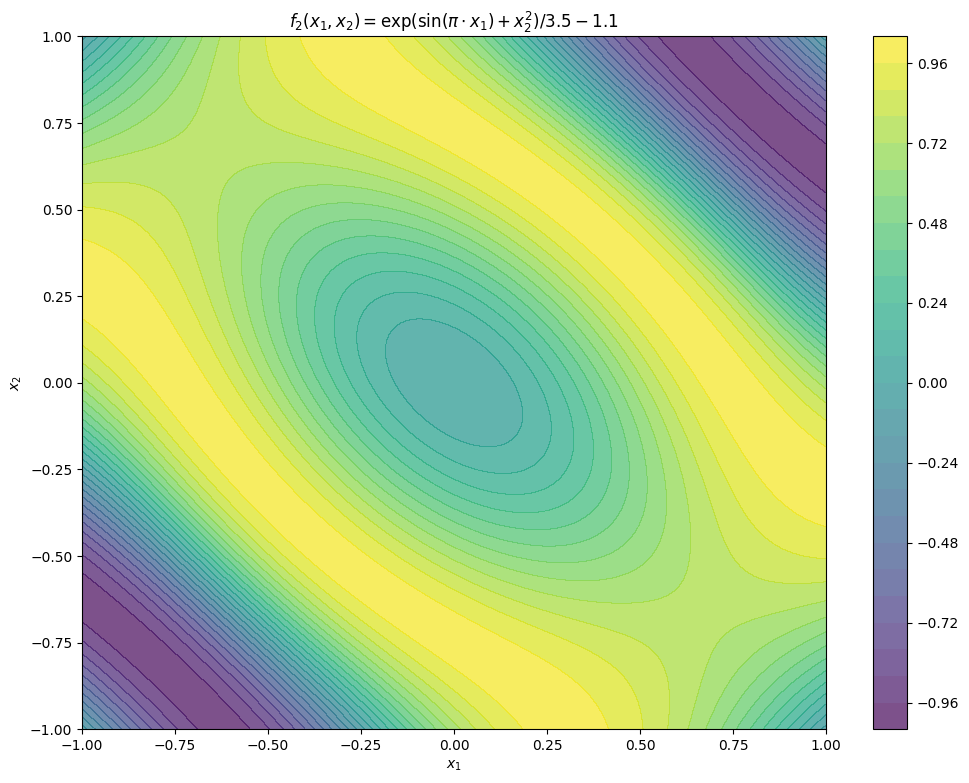

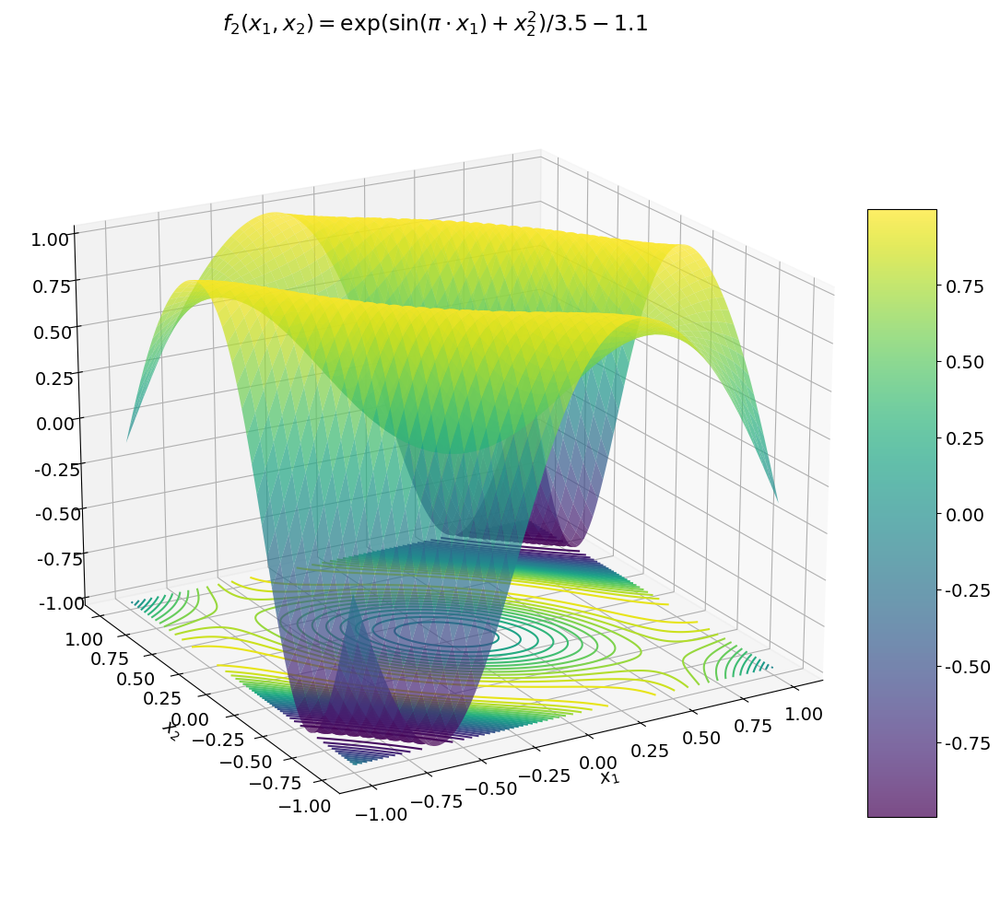

In [2]:
# create dataset
f2 = lambda x: torch.sin(torch.pi*( (x[:,[0]]*x[:,[1]]) + torch.tanh(x[:,[0]]**2 + x[:,[1]]**2) ))
dataset2 = create_dataset(f2, n_var=2, device=device)

f = f2
dataset = dataset2

plot_f_2d(f2, title='$f_2(x_1, x_2) = \exp(\sin(\pi \cdot x_1) +  x_2^2) / 3.5 - 1.1$')
plot_f_3d(f2, title='$f_2(x_1, x_2) = \exp(\sin(\pi \cdot x_1) +  x_2^2) / 3.5 - 1.1$')

-----
### MLP on $f_2$

№ model trainable params: 216


| train_loss: 2.45e-02 | test_loss: 2.23e-02 | reg: 1.35e+02 | : 100%|█| 100/100 [00:08<00:00, 12.02


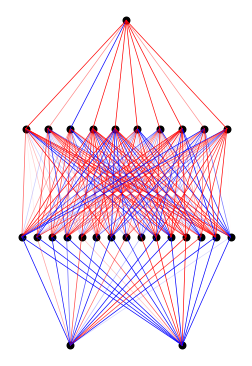

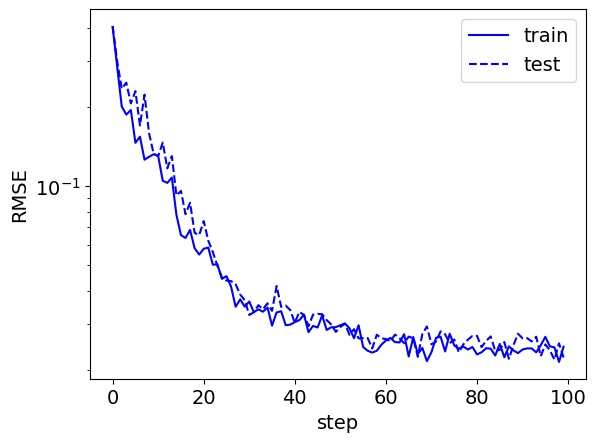

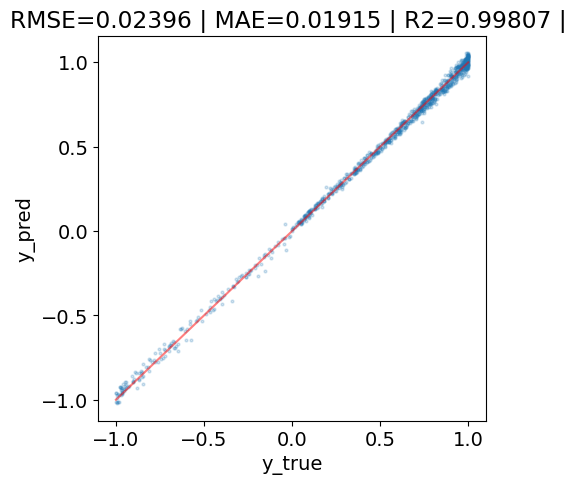

In [3]:
# initialize MLP
model = MLP(width=[2,15,10,1], seed=1, device=device)
pytorch_total_params = sum(p.numel() for p in model.parameters() if p.requires_grad) # trainable params

print(f'№ model trainable params: {pytorch_total_params}')

results = model.fit(dataset, steps=100, lamb = 0, batch=250)
kan_summary_after_fit(model, dataset, results)

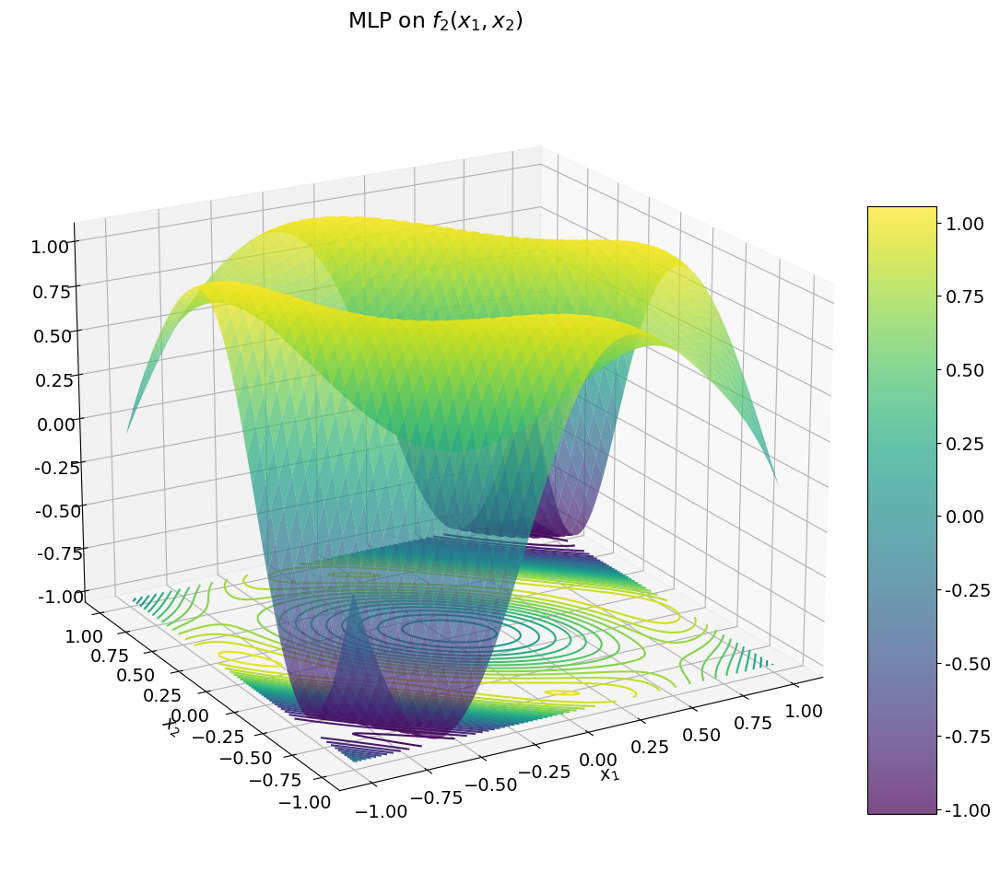

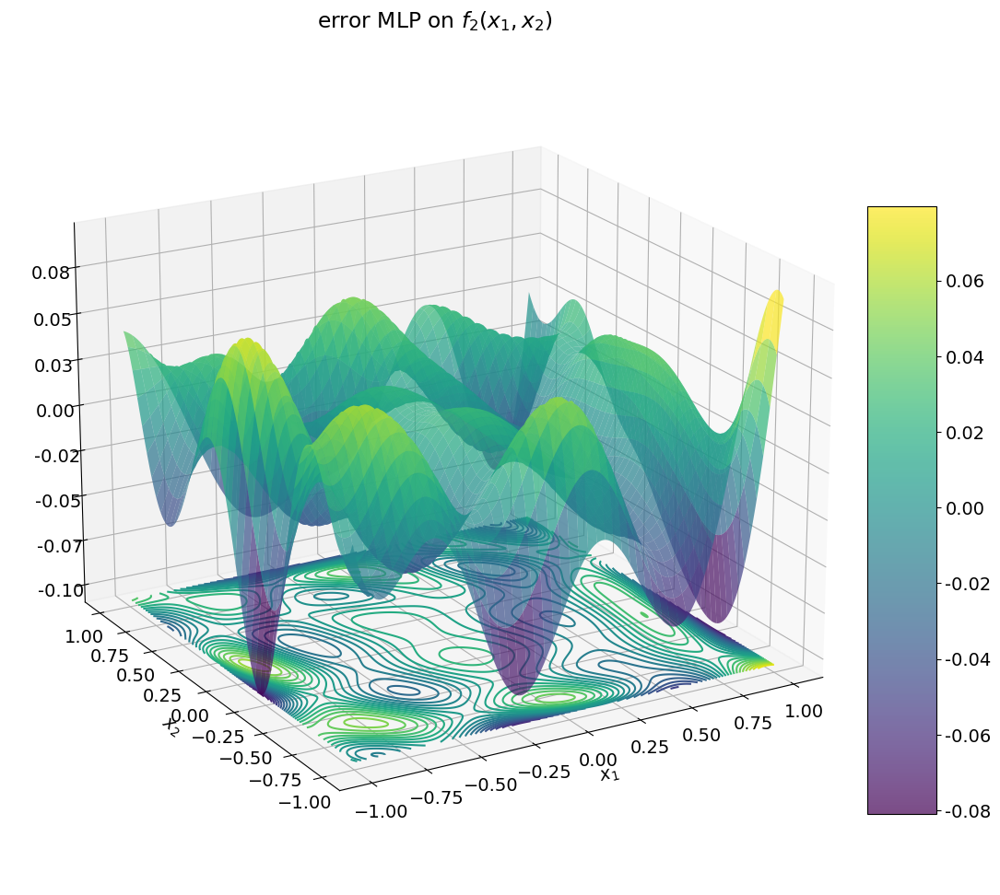

In [4]:
model_plot = lambda x: model(x).detach()
plot_f_3d(model_plot, title='MLP on $f_2(x_1, x_2)$')

error_model_plot = lambda x: model(x).detach() - f(x)
plot_f_3d(error_model_plot, title='error MLP on $f_2(x_1, x_2)$')

-----
### KAN on $f_2$

checkpoint directory created: ./model
saving model version 0.0
№ model trainable params: 180


| train_loss: 2.58e-02 | test_loss: 3.00e-02 | reg: 1.45e+01 | : 100%|█| 100/100 [00:38<00:00,  2.61


saving model version 0.1


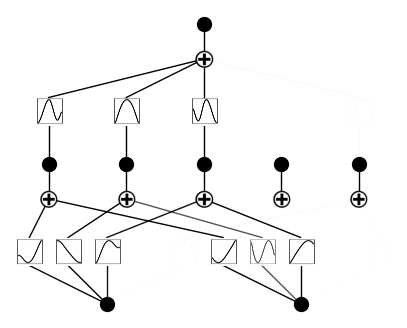

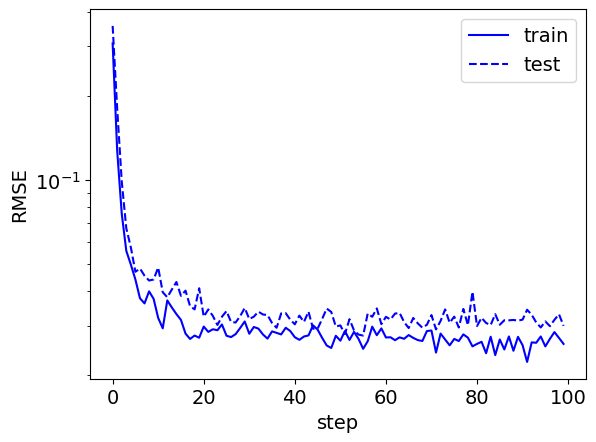

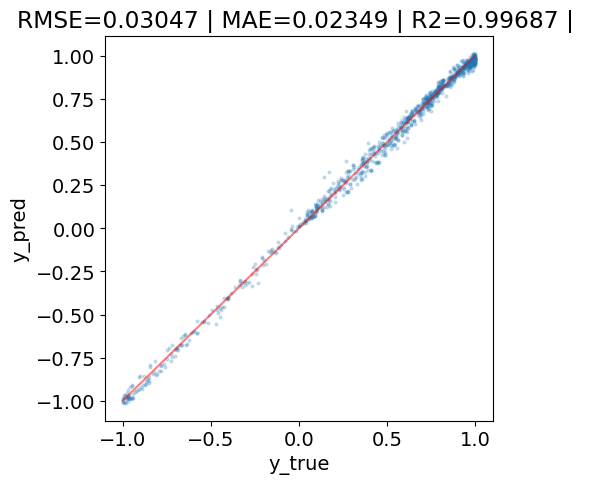

In [5]:
# initialize KAN with G=3
model = KAN(width=[2,5,1], grid=3, k=3, seed=1, device=device)
pytorch_total_params = sum(p.numel() for p in model.parameters() if p.requires_grad) # trainable params

print(f'№ model trainable params: {pytorch_total_params}')

results = model.fit(dataset, steps=100, lamb=1e-4, update_grid=False, batch=250)
kan_summary_after_fit(model, dataset, results)

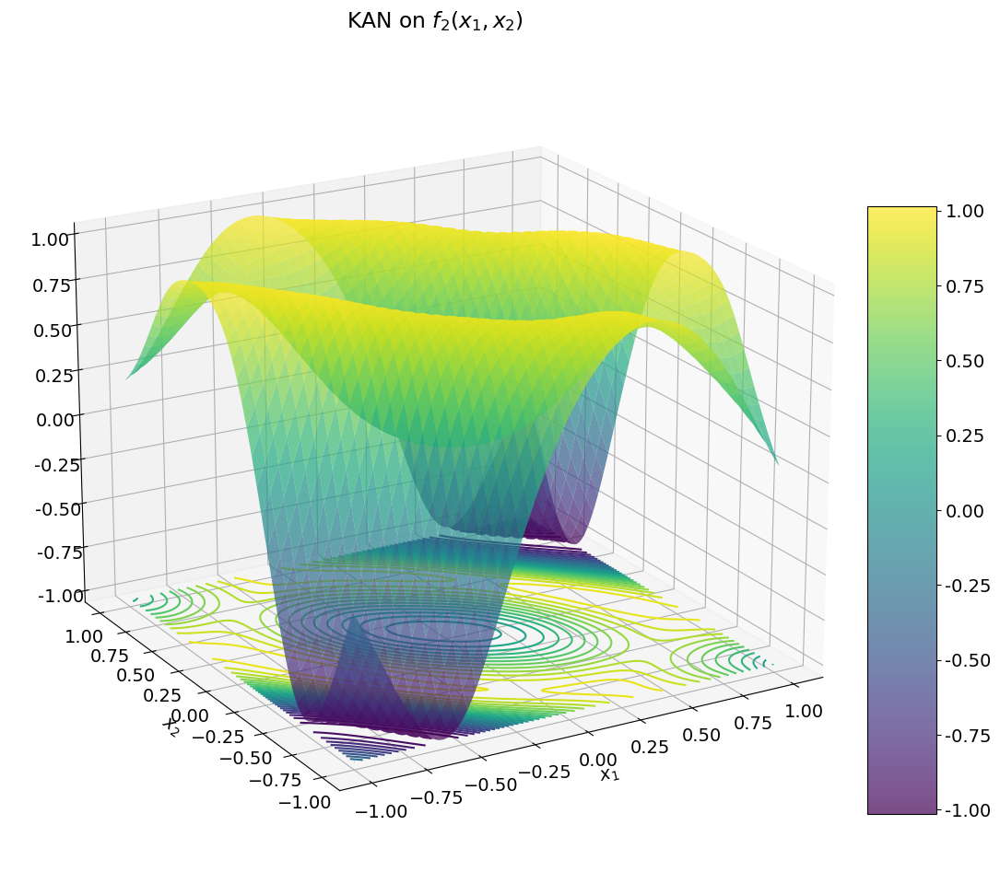

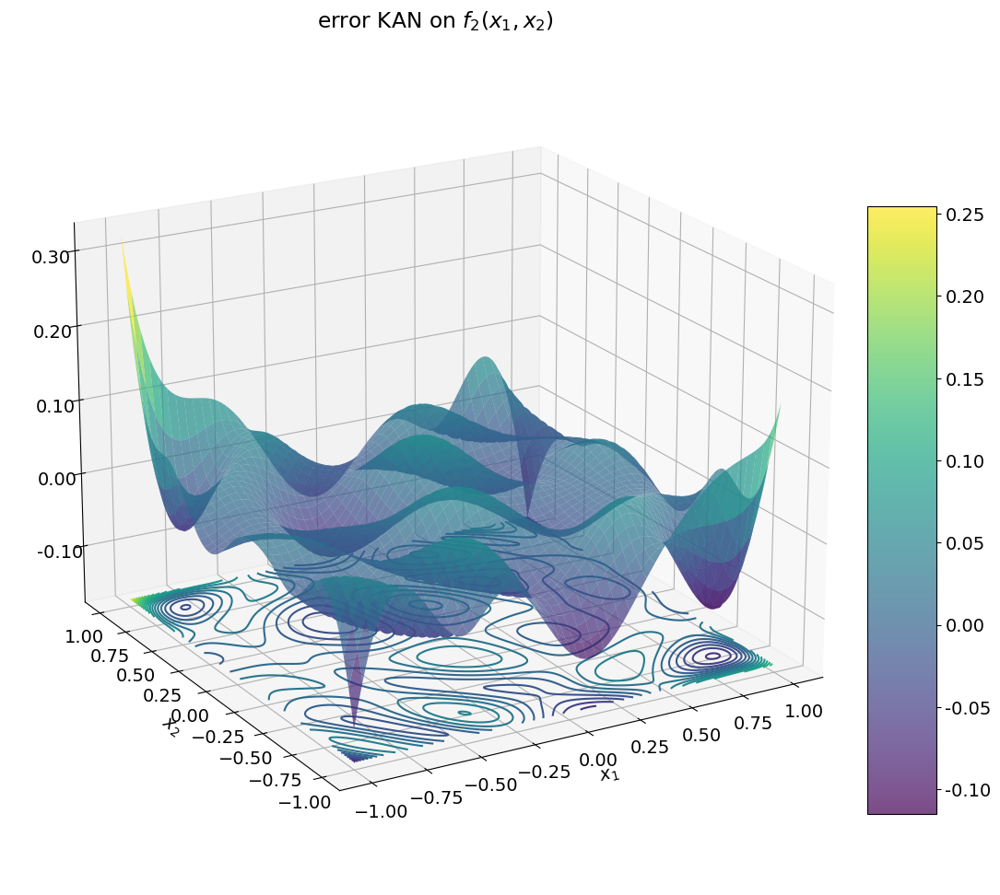

In [6]:
model_plot = lambda x: model(x).detach()
plot_f_3d(model_plot, title='KAN on $f_2(x_1, x_2)$')

error_model_plot = lambda x: model(x).detach() - f(x)
plot_f_3d(error_model_plot, title='error KAN on $f_2(x_1, x_2)$')

-----
### $\lambda$-KAN on $f_2$

checkpoint directory created: ./model
saving model version 0.0
№ model trainable params: 142


description:   0%|                                                          | 0/150 [00:00<?, ?it/s]

| train_loss: 2.73e-02 | test_loss: 4.46e-02 | reg: 1.96e+01 | : 100%|█| 150/150 [01:04<00:00,  2.33


saving model version 0.1


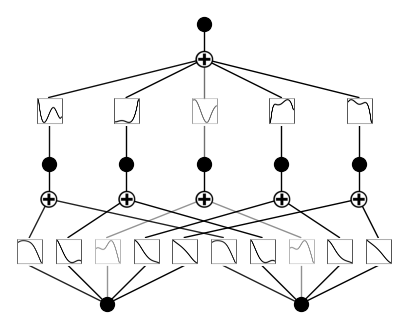

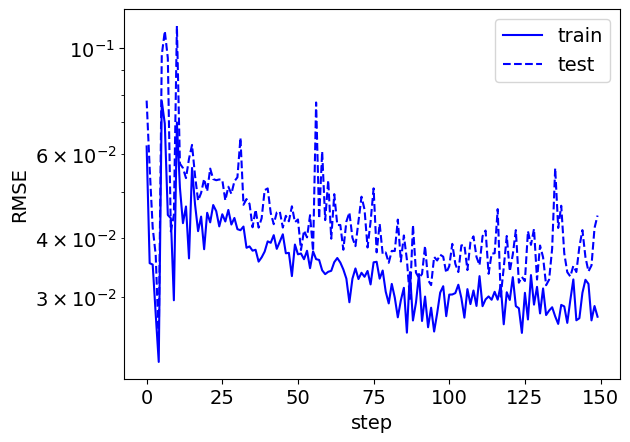

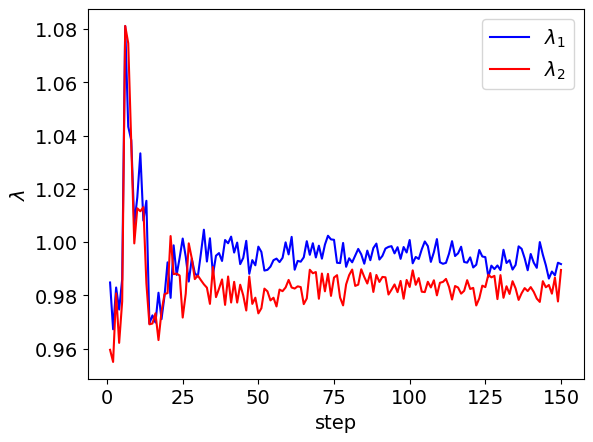

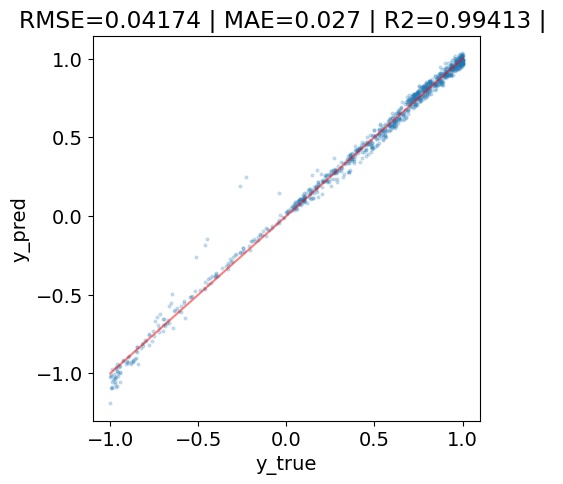

model.act_fun[0].lmd=Parameter containing:
tensor([0.9918, 0.9895], requires_grad=True)


In [27]:
# initialize lmdKAN with G=3
model = lmdKAN(width=[2,5,1], grid=3, k=3, seed=1, device=device)
pytorch_total_params = sum(p.numel() for p in model.parameters() if p.requires_grad) # trainable params

print(f'№ model trainable params: {pytorch_total_params}')

results = model.fit(dataset, steps=150, lamb = 1e-4, 
                    lamb_lmd_interm=0.0, lamb_lmd_final=0.0, reg_type='entropy',
                    batch=250)
kan_summary_after_fit(model, dataset, results, lmdKAN=True)
print(f'{model.act_fun[0].lmd=}')

ExactExplainer explainer: 1001it [00:16, 23.13it/s]                         


module of Input importance:


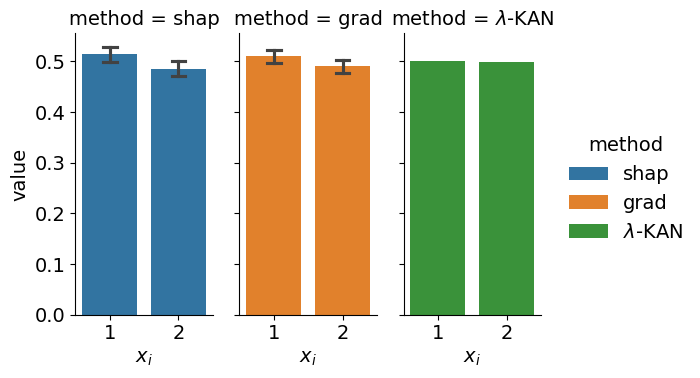

Input importance:


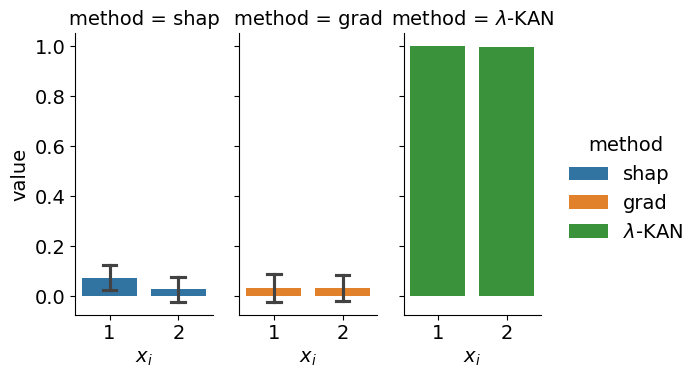

In [28]:
importance_analyse_lmdKAN(model, dataset)

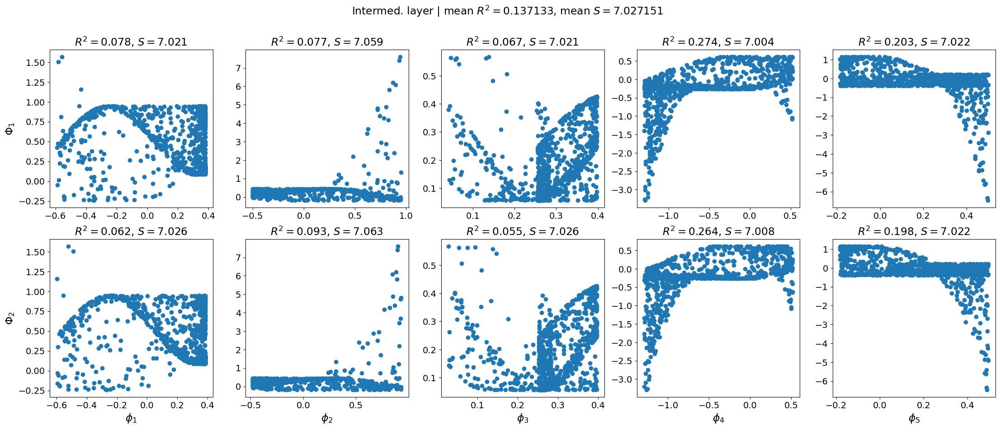

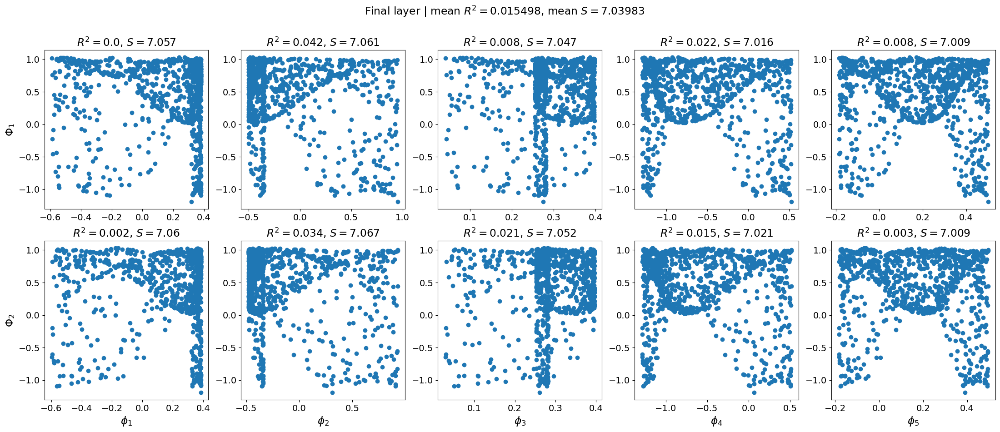

{'mean_r2': 0.015497686254275323, 'mean_matrix_entropy': 7.039830207824707}

In [29]:
model.lmd_corr_plot(title_text='Intermed. layer')
model.lmd_corr_plot(fin_layer=True, title_text='Final layer')

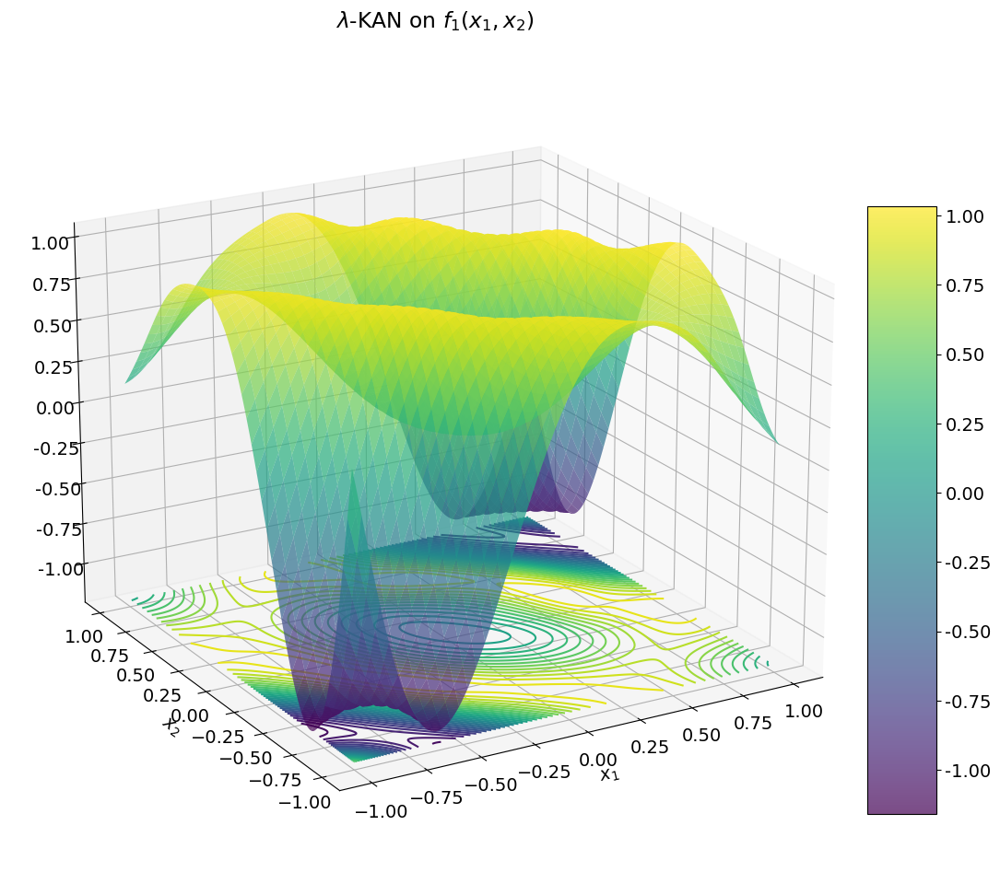

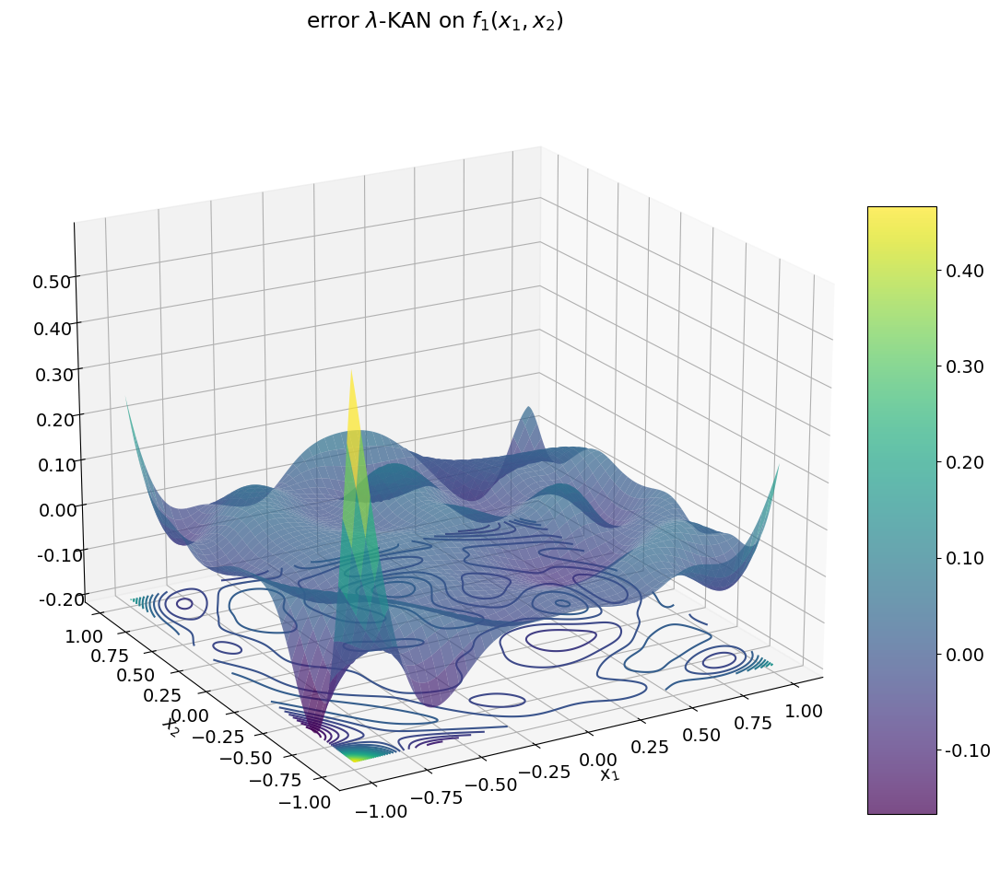

In [30]:
model_plot = lambda x: model(x).detach()
plot_f_3d(model_plot, title='$\lambda$-KAN on $f_1(x_1, x_2)$')

error_model_plot = lambda x: model(x).detach() - f(x)
plot_f_3d(error_model_plot, title='error $\lambda$-KAN on $f_1(x_1, x_2)$')

-----
-----
### $\lambda$-KAN on $f_2$ with __R2 regression__ in respect to __Interm. activations__

checkpoint directory created: ./model
saving model version 0.0
№ model trainable params: 142


| train_loss: 3.17e-02 | test_loss: 3.88e-02 | reg: 1.45e+01 | : 100%|█| 150/150 [01:48<00:00,  1.38


saving model version 0.1


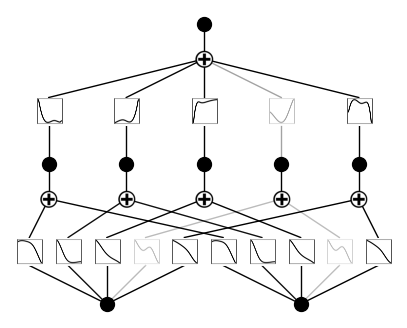

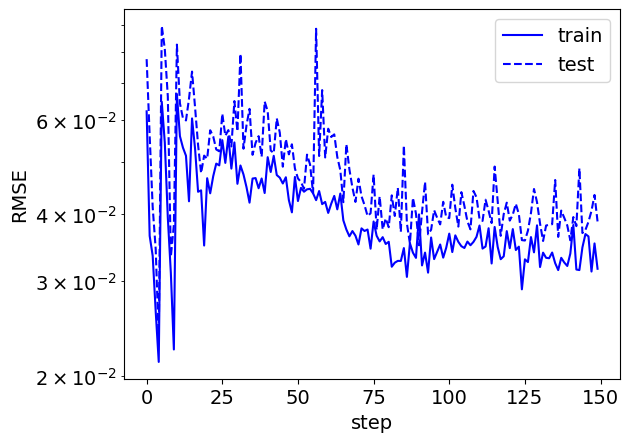

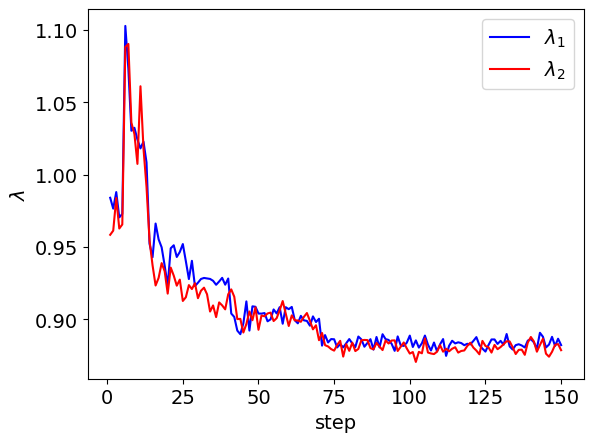

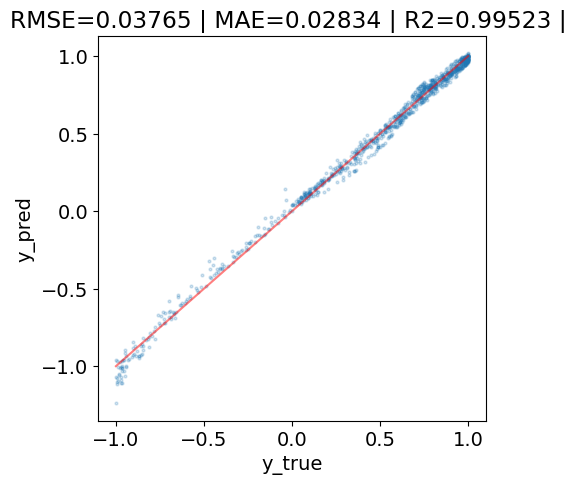

model.act_fun[0].lmd=Parameter containing:
tensor([0.8821, 0.8785], requires_grad=True)


In [9]:
# initialize lmdKAN with G=3
model = lmdKAN(width=[2,5,1], grid=3, k=3, seed=1, device=device)
pytorch_total_params = sum(p.numel() for p in model.parameters() if p.requires_grad) # trainable params

print(f'№ model trainable params: {pytorch_total_params}')

results = model.fit(dataset, steps=150, lamb = 1e-4, 
                    lamb_lmd_interm=1.0, lamb_lmd_final=0.0, reg_type='r2',
                    batch=250)

kan_summary_after_fit(model, dataset, results, lmdKAN=True)

model.forward(dataset['test_input'])

print(f'{model.act_fun[0].lmd=}')

ExactExplainer explainer: 1001it [00:14, 22.02it/s]                         


module of Input importance:


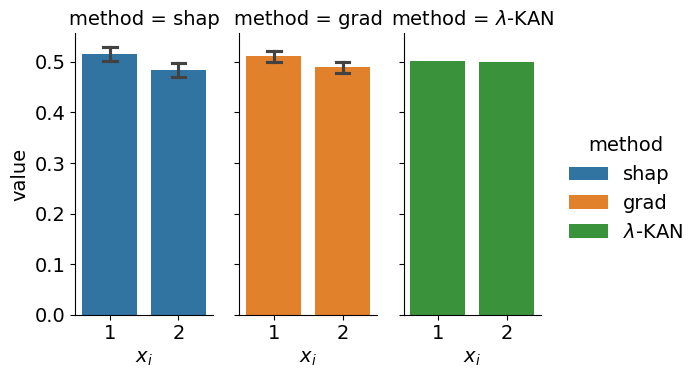

Input importance:


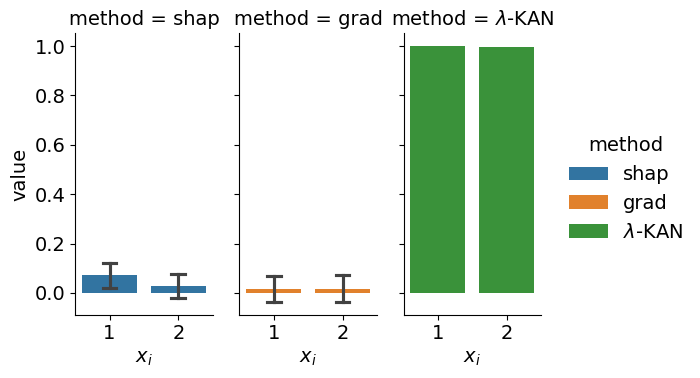

In [10]:
importance_analyse_lmdKAN(model, dataset)

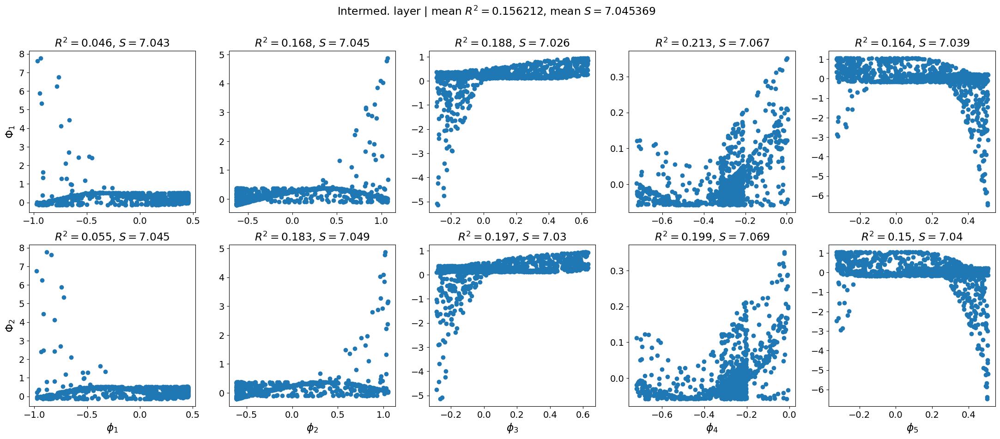

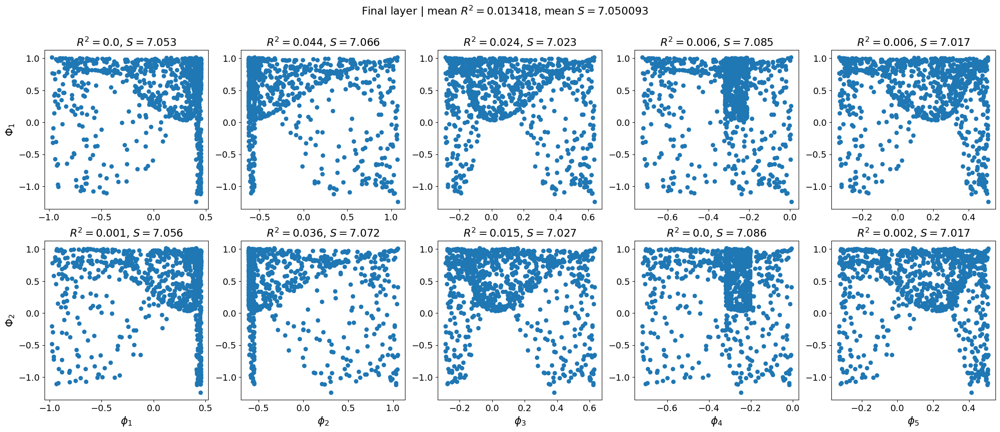

{'mean_r2': 0.013417745081096655, 'mean_matrix_entropy': 7.050093173980713}

In [11]:
model.lmd_corr_plot(title_text='Intermed. layer')
model.lmd_corr_plot(fin_layer=True, title_text='Final layer')

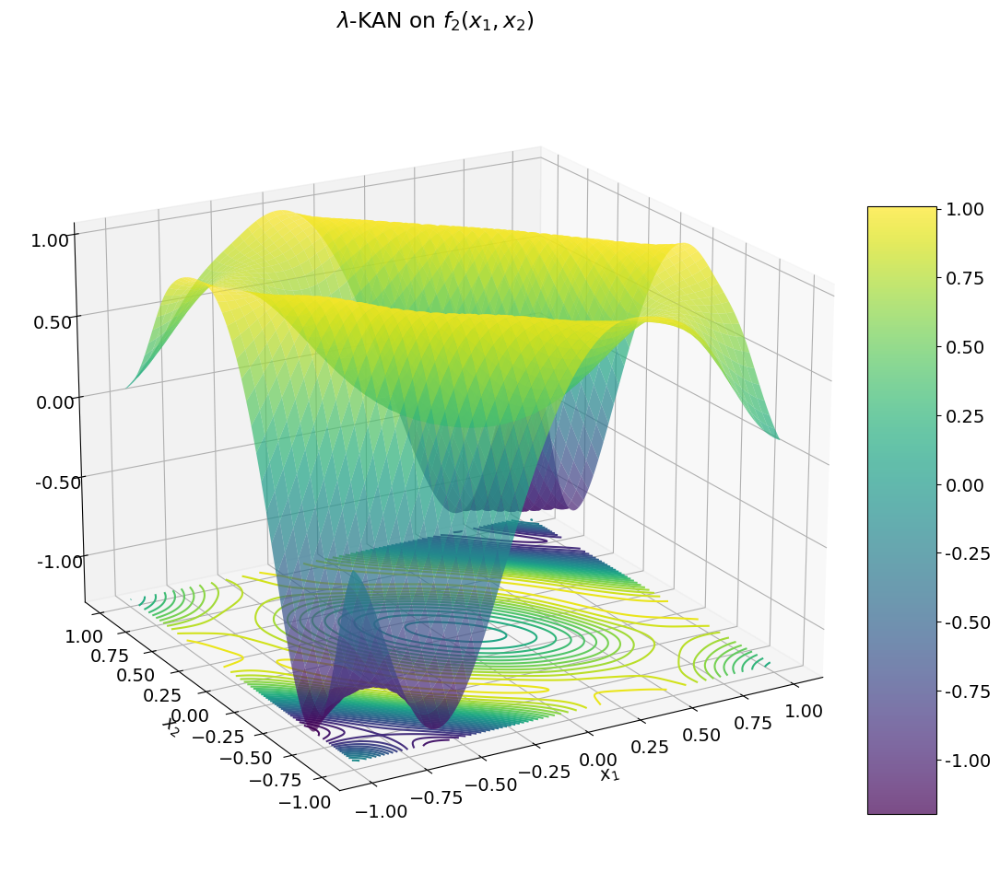

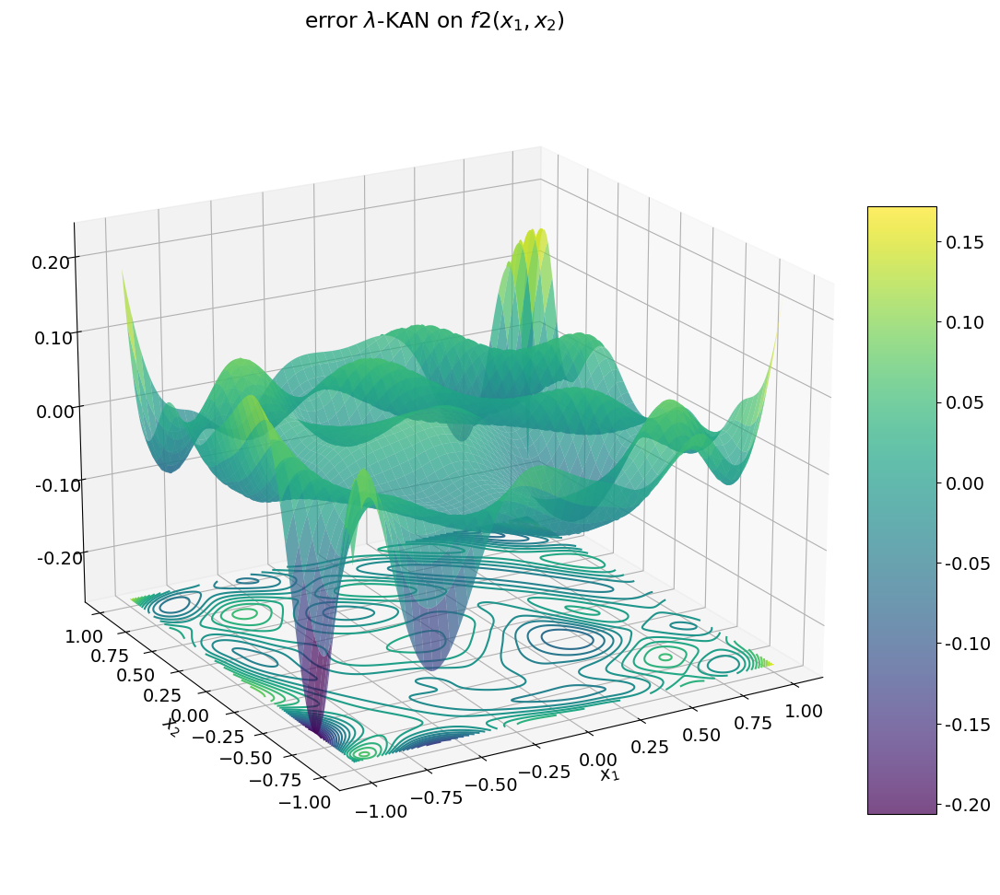

In [12]:
model_plot = lambda x: model(x).detach()
plot_f_3d(model_plot, title='$\lambda$-KAN on $f_2(x_1, x_2)$')

error_model_plot = lambda x: model(x).detach() - f(x)
plot_f_3d(error_model_plot, title='error $\lambda$-KAN on $f2(x_1, x_2)$')

-----
### $\lambda$-KAN on $f_2$ with __Entropy regression__ in respect to __Interm. activations__

checkpoint directory created: ./model
saving model version 0.0
№ model trainable params: 142


| train_loss: 2.52e-02 | test_loss: 3.23e-02 | reg: 1.43e+01 | : 100%|█| 150/150 [01:17<00:00,  1.94


saving model version 0.1


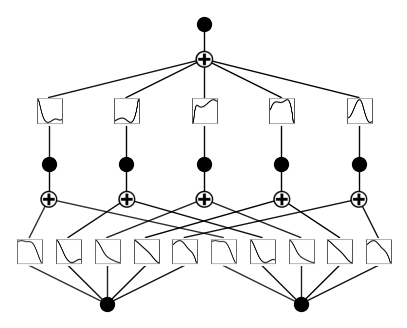

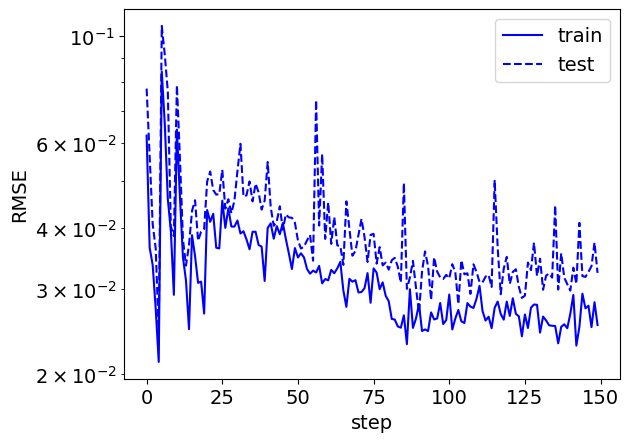

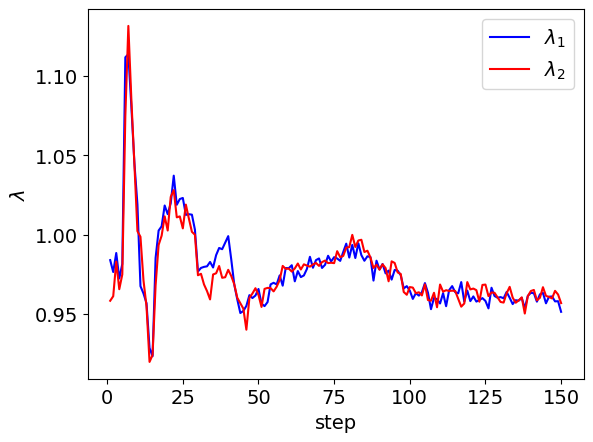

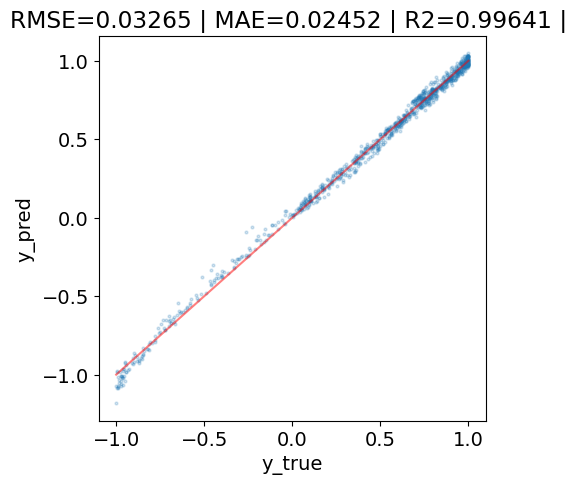

model.act_fun[0].lmd=Parameter containing:
tensor([0.9514, 0.9569], requires_grad=True)


In [13]:
# initialize lmdKAN with G=3
model = lmdKAN(width=[2,5,1], grid=3, k=3, seed=1, device=device)
pytorch_total_params = sum(p.numel() for p in model.parameters() if p.requires_grad) # trainable params

print(f'№ model trainable params: {pytorch_total_params}')

results = model.fit(dataset, steps=150, lamb = 1e-4, 
                    lamb_lmd_interm=1.0, lamb_lmd_final=0.0, reg_type='entropy',
                    batch=250)

kan_summary_after_fit(model, dataset, results, lmdKAN=True)

model.forward(dataset['test_input'])

print(f'{model.act_fun[0].lmd=}')

ExactExplainer explainer: 1001it [00:14, 23.47it/s]                         


module of Input importance:


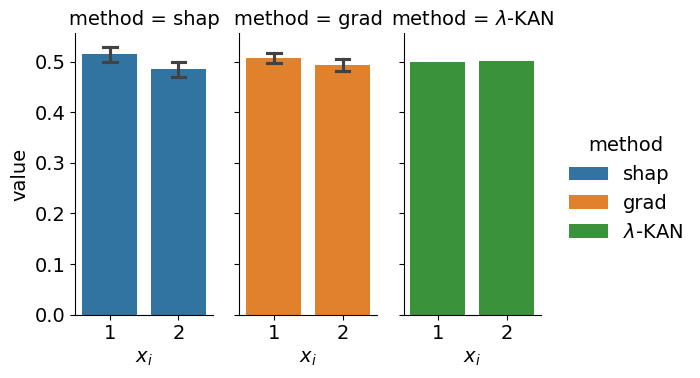

Input importance:


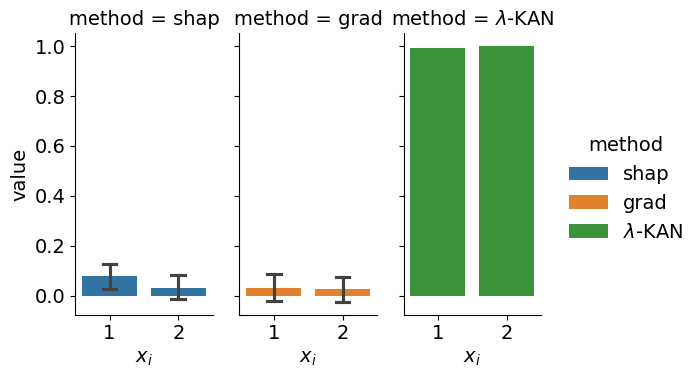

In [14]:
importance_analyse_lmdKAN(model, dataset)

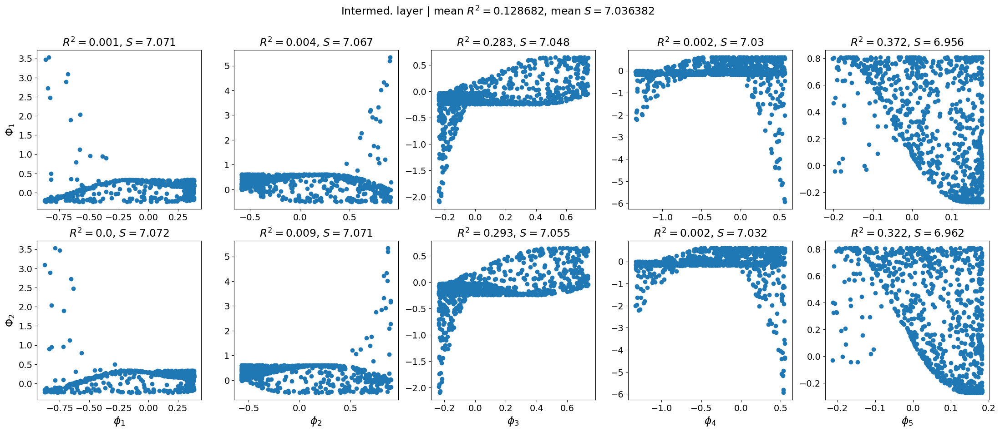

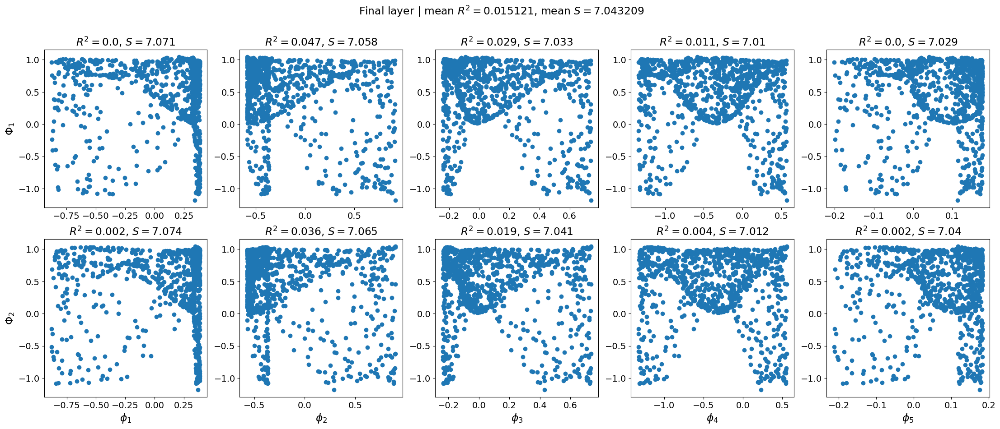

{'mean_r2': 0.015121398030350975, 'mean_matrix_entropy': 7.043209075927734}

In [15]:
model.lmd_corr_plot(title_text='Intermed. layer')
model.lmd_corr_plot(fin_layer=True, title_text='Final layer')

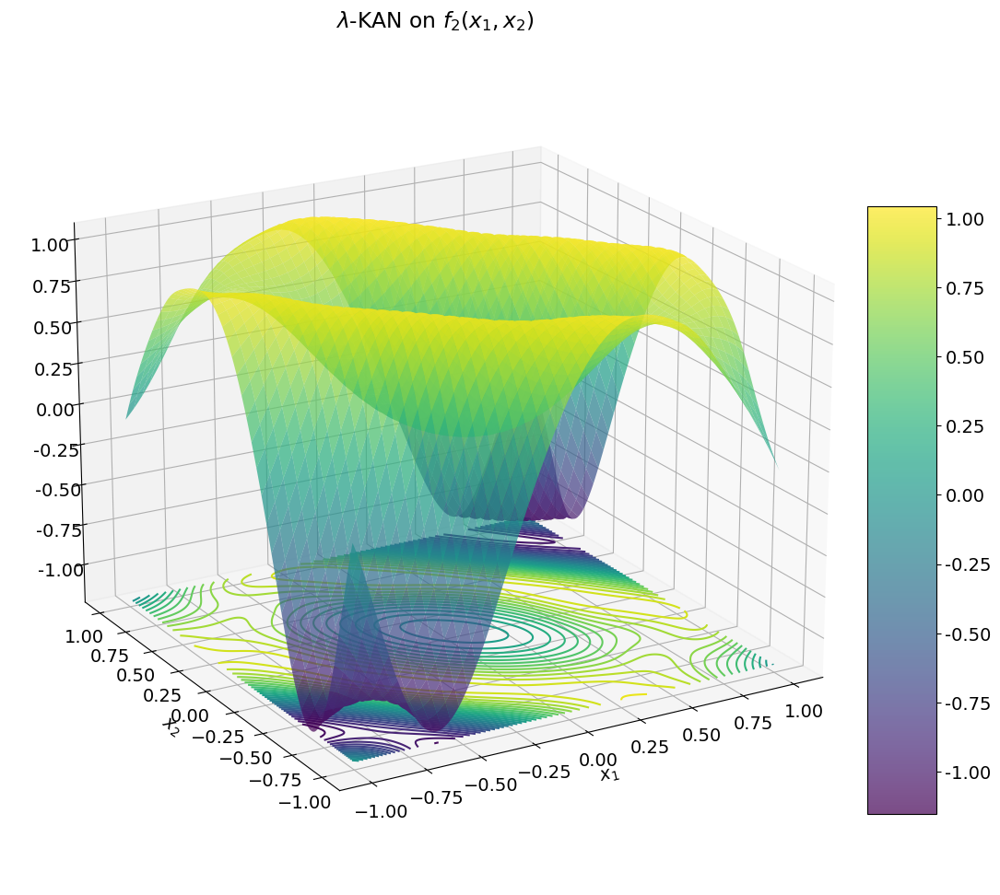

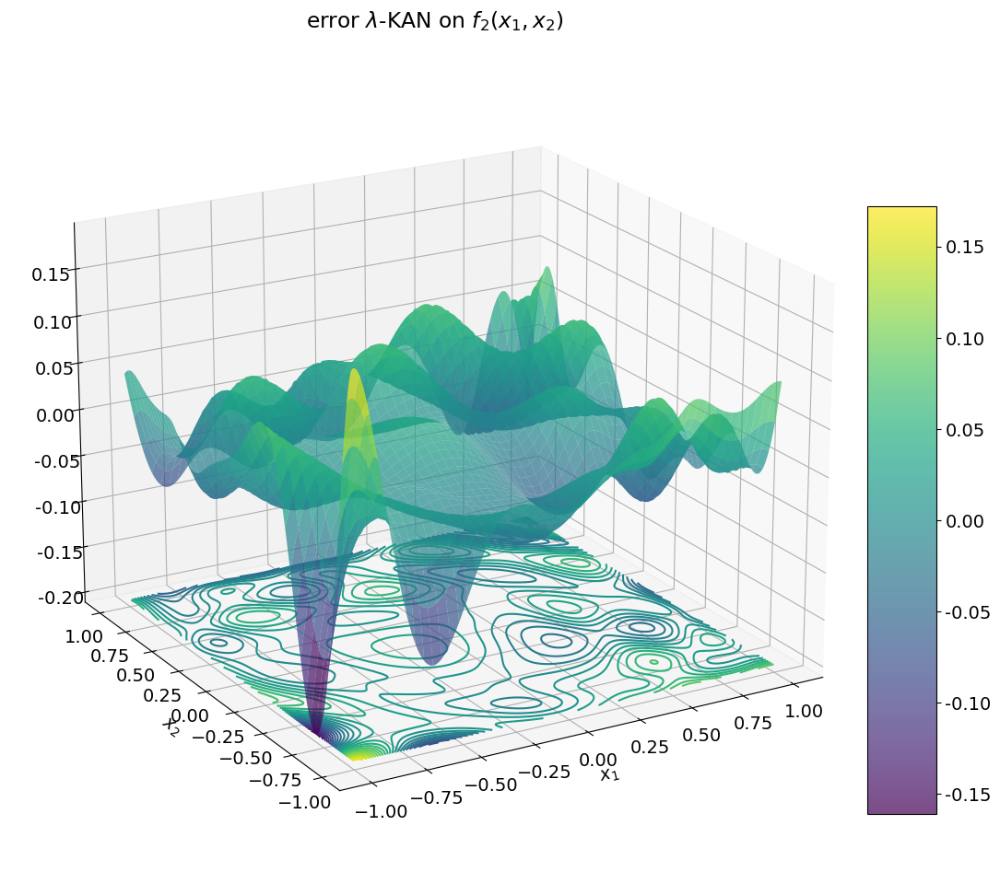

In [16]:
model_plot = lambda x: model(x).detach()
plot_f_3d(model_plot, title='$\lambda$-KAN on $f_2(x_1, x_2)$')

error_model_plot = lambda x: model(x).detach() - f(x)
plot_f_3d(error_model_plot, title='error $\lambda$-KAN on $f_2(x_1, x_2)$')

-----
-----
### $\lambda$-KAN on $f_2$ with __R2 regression__ in respect to __Final activations__

checkpoint directory created: ./model
saving model version 0.0
№ model trainable params: 142


| train_loss: 2.74e-02 | test_loss: 3.36e-02 | reg: 1.43e+01 | : 100%|█| 150/150 [01:51<00:00,  1.35


saving model version 0.1


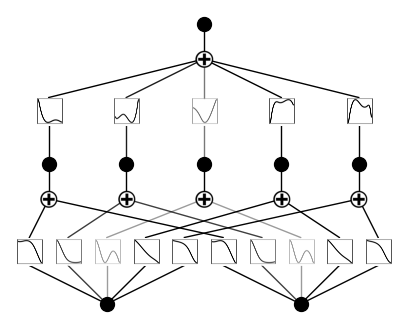

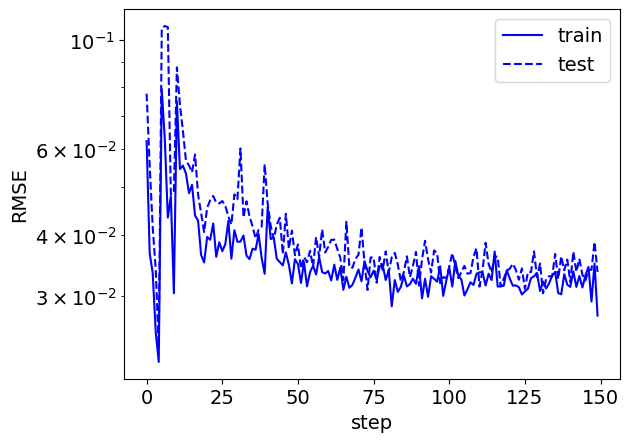

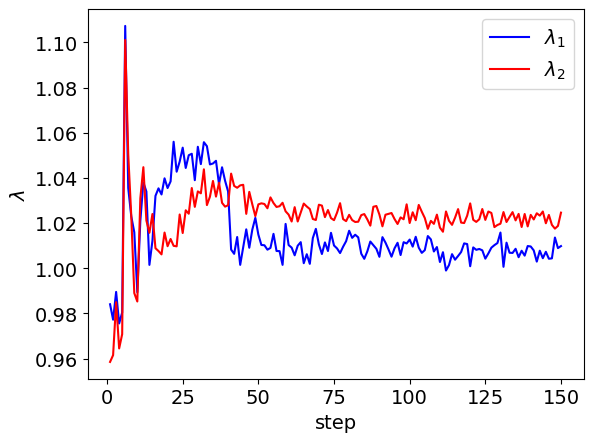

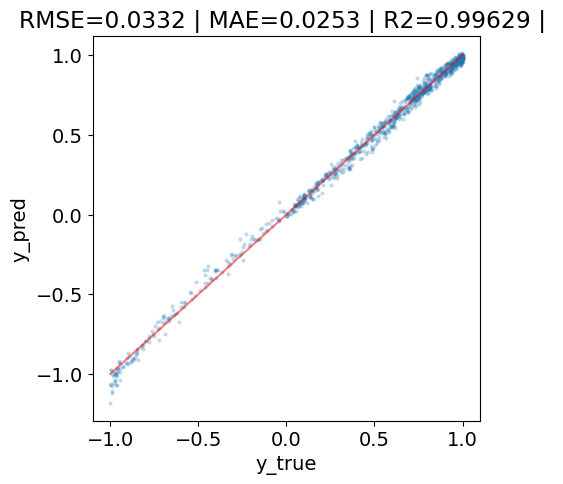

model.act_fun[0].lmd=Parameter containing:
tensor([1.0098, 1.0246], requires_grad=True)


In [17]:
# initialize lmdKAN with G=3
model = lmdKAN(width=[2,5,1], grid=3, k=3, seed=1, device=device)
pytorch_total_params = sum(p.numel() for p in model.parameters() if p.requires_grad) # trainable params

print(f'№ model trainable params: {pytorch_total_params}')

results = model.fit(dataset, steps=150, lamb = 1e-4, 
                    lamb_lmd_interm=0.0, lamb_lmd_final=1.0, reg_type='r2',
                    batch=250)

kan_summary_after_fit(model, dataset, results, lmdKAN=True)

model.forward(dataset['test_input'])

print(f'{model.act_fun[0].lmd=}')

ExactExplainer explainer: 1001it [00:24, 24.64it/s]                         


module of Input importance:


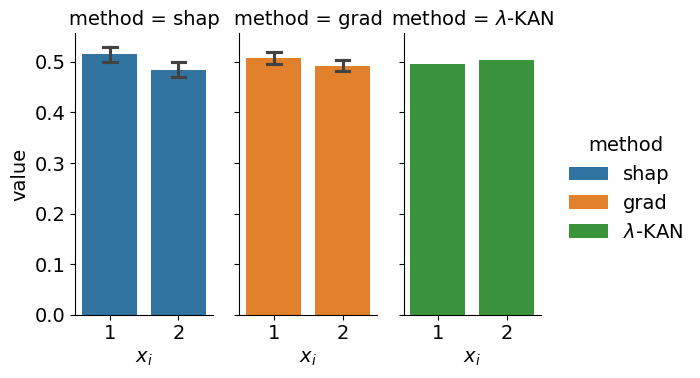

Input importance:


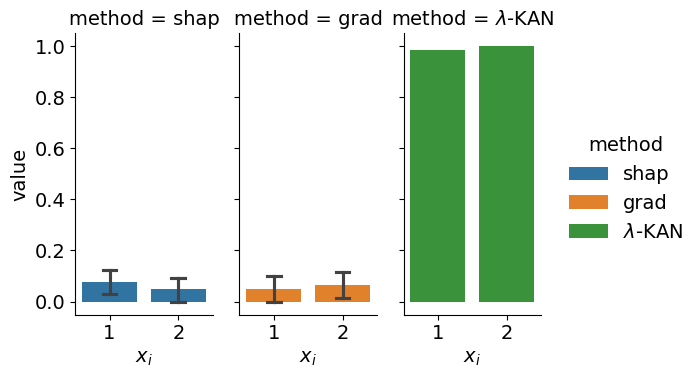

In [18]:
importance_analyse_lmdKAN(model, dataset)

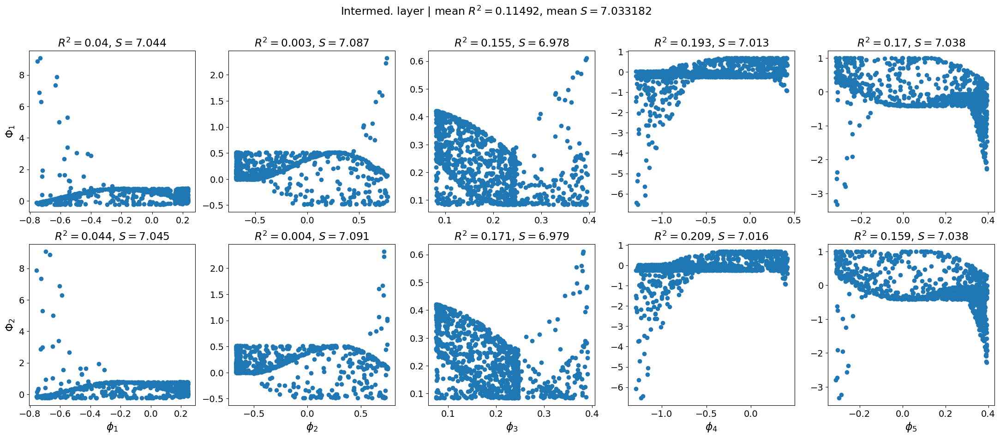

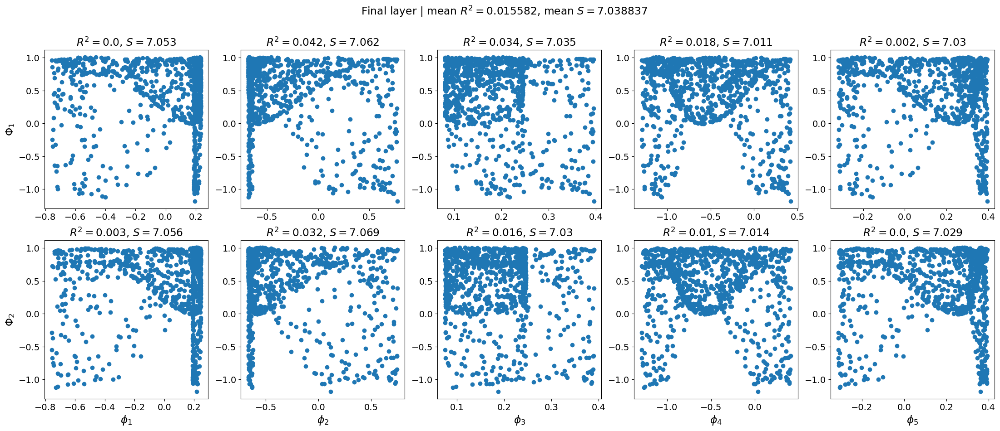

{'mean_r2': 0.015581769727040395, 'mean_matrix_entropy': 7.038837432861328}

In [19]:
model.lmd_corr_plot(title_text='Intermed. layer')
model.lmd_corr_plot(fin_layer=True, title_text='Final layer')

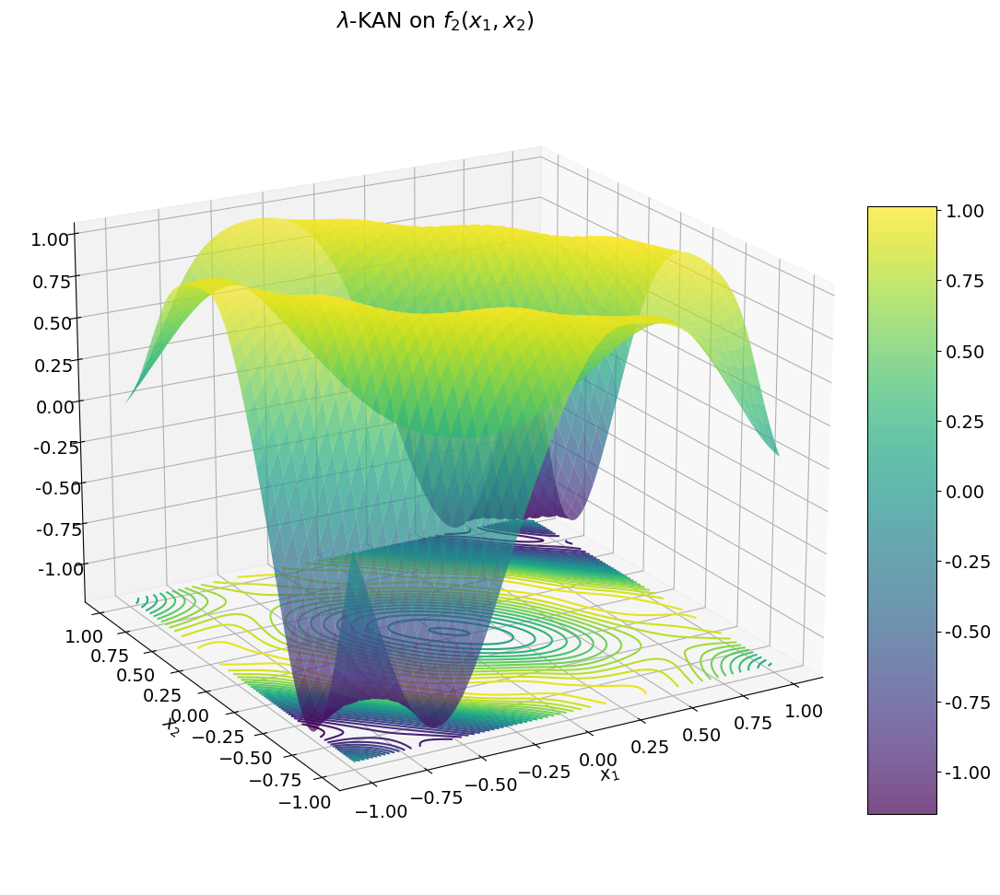

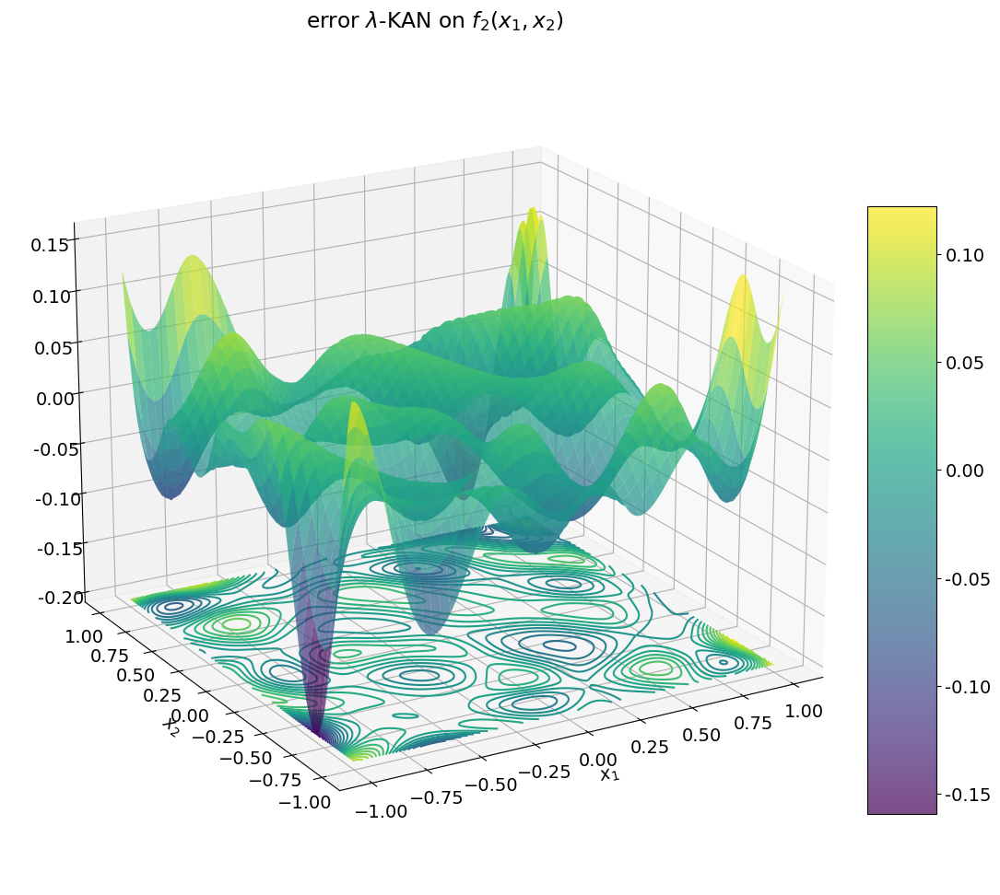

In [20]:
model_plot = lambda x: model(x).detach()
plot_f_3d(model_plot, title='$\lambda$-KAN on $f_2(x_1, x_2)$')

error_model_plot = lambda x: model(x).detach() - f(x)
plot_f_3d(error_model_plot, title='error $\lambda$-KAN on $f_2(x_1, x_2)$')

-----
### $\lambda$-KAN on $f_2$ with __Entropy regression__ in respect to __Final activations__

checkpoint directory created: ./model
saving model version 0.0
№ model trainable params: 142


description:   0%|                                                          | 0/150 [00:00<?, ?it/s]

| train_loss: 2.79e-02 | test_loss: 3.28e-02 | reg: 1.43e+01 | : 100%|█| 150/150 [01:55<00:00,  1.30


saving model version 0.1


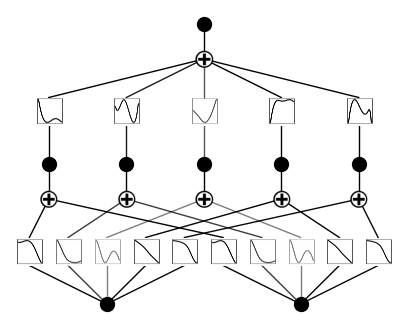

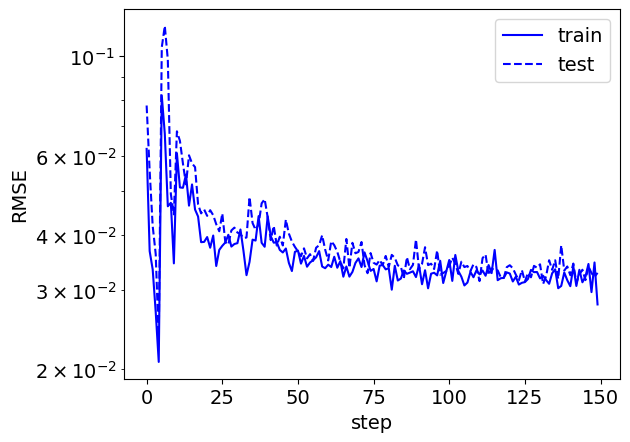

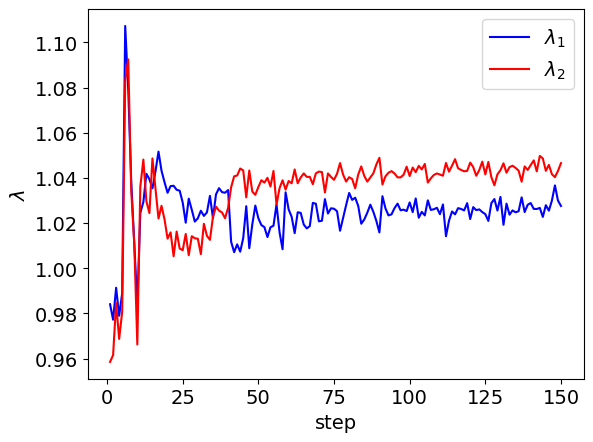

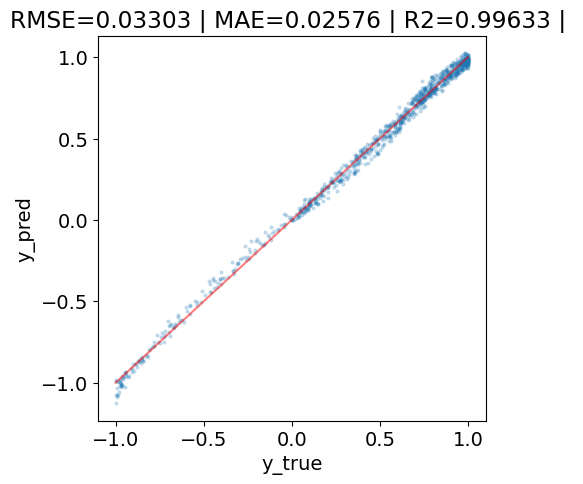

model.act_fun[0].lmd=Parameter containing:
tensor([1.0276, 1.0465], requires_grad=True)


In [22]:
# initialize lmdKAN with G=3
model = lmdKAN(width=[2,5,1], grid=3, k=3, seed=1, device=device)
pytorch_total_params = sum(p.numel() for p in model.parameters() if p.requires_grad) # trainable params

print(f'№ model trainable params: {pytorch_total_params}')

results = model.fit(dataset, steps=150, lamb = 1e-4, 
                    lamb_lmd_interm=0.0, lamb_lmd_final=1.0, reg_type='entropy',
                    batch=250)

kan_summary_after_fit(model, dataset, results, lmdKAN=True)

model.forward(dataset['test_input'])

print(f'{model.act_fun[0].lmd=}')

ExactExplainer explainer: 1001it [00:22, 26.08it/s]                         


module of Input importance:


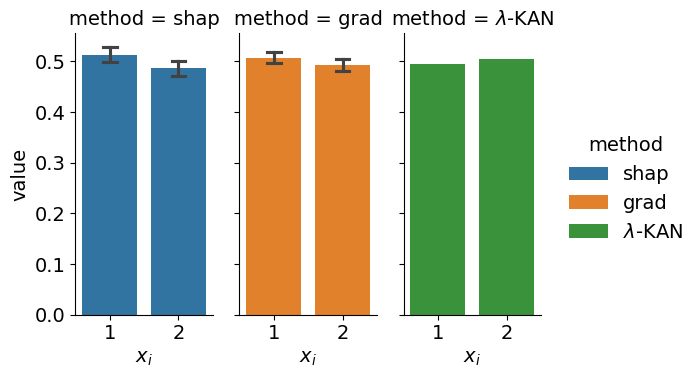

Input importance:


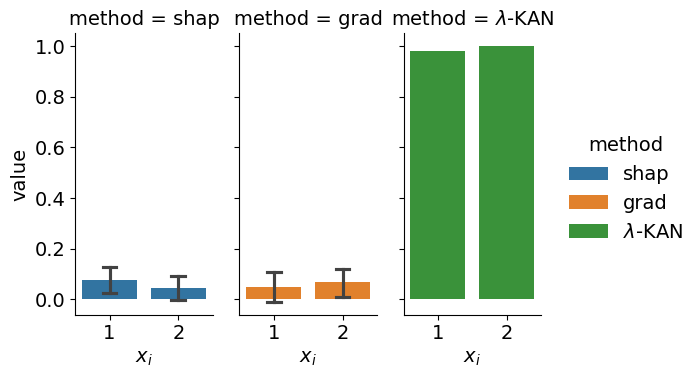

In [23]:
importance_analyse_lmdKAN(model, dataset)

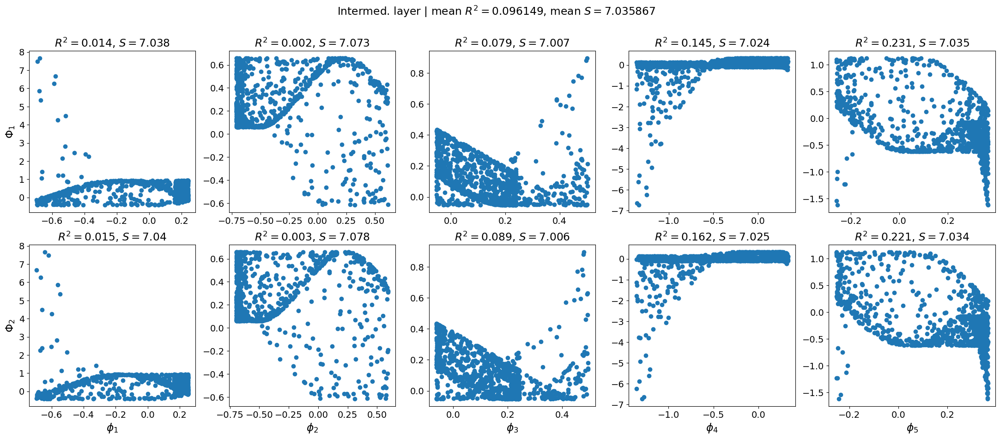

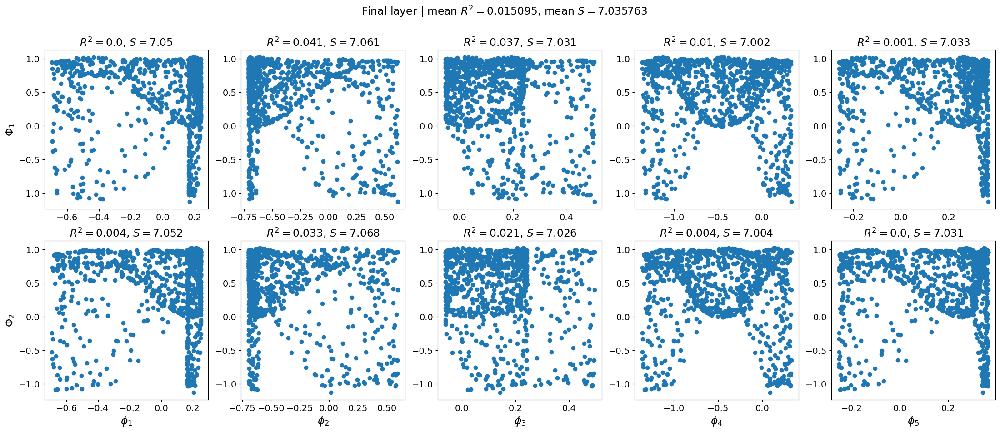

{'mean_r2': 0.015095203544478863, 'mean_matrix_entropy': 7.035762786865234}

In [24]:
model.lmd_corr_plot(title_text='Intermed. layer')
model.lmd_corr_plot(fin_layer=True, title_text='Final layer')

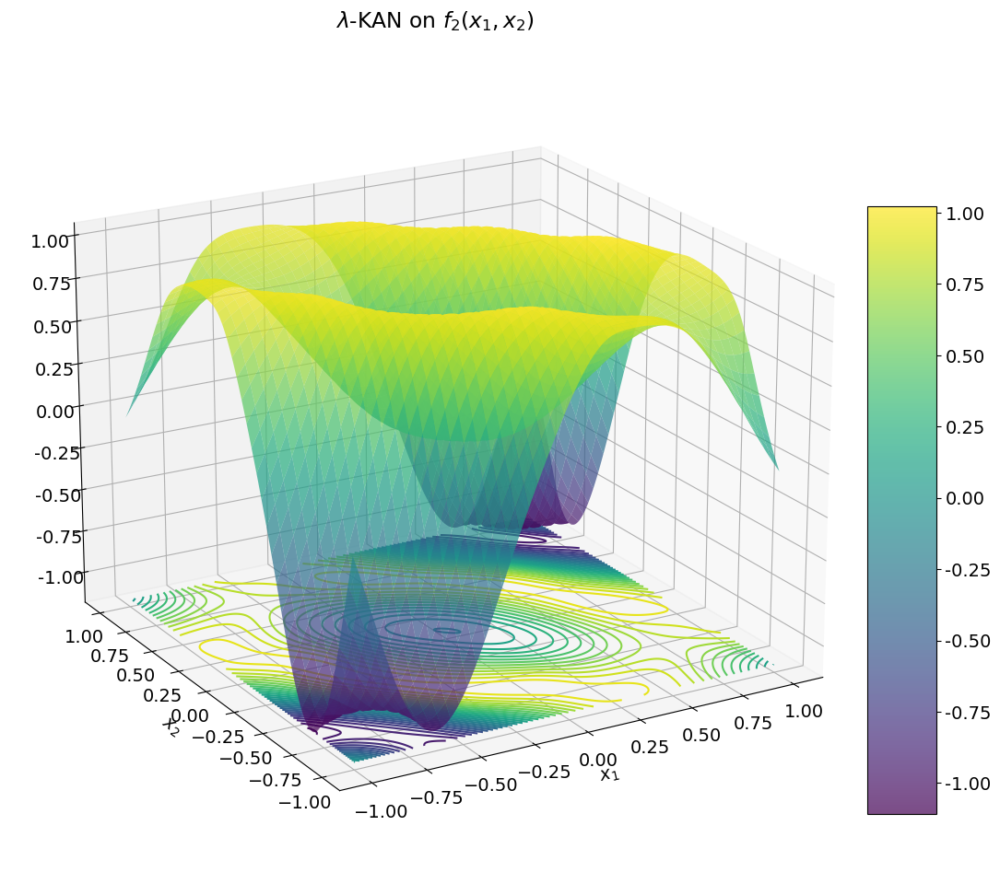

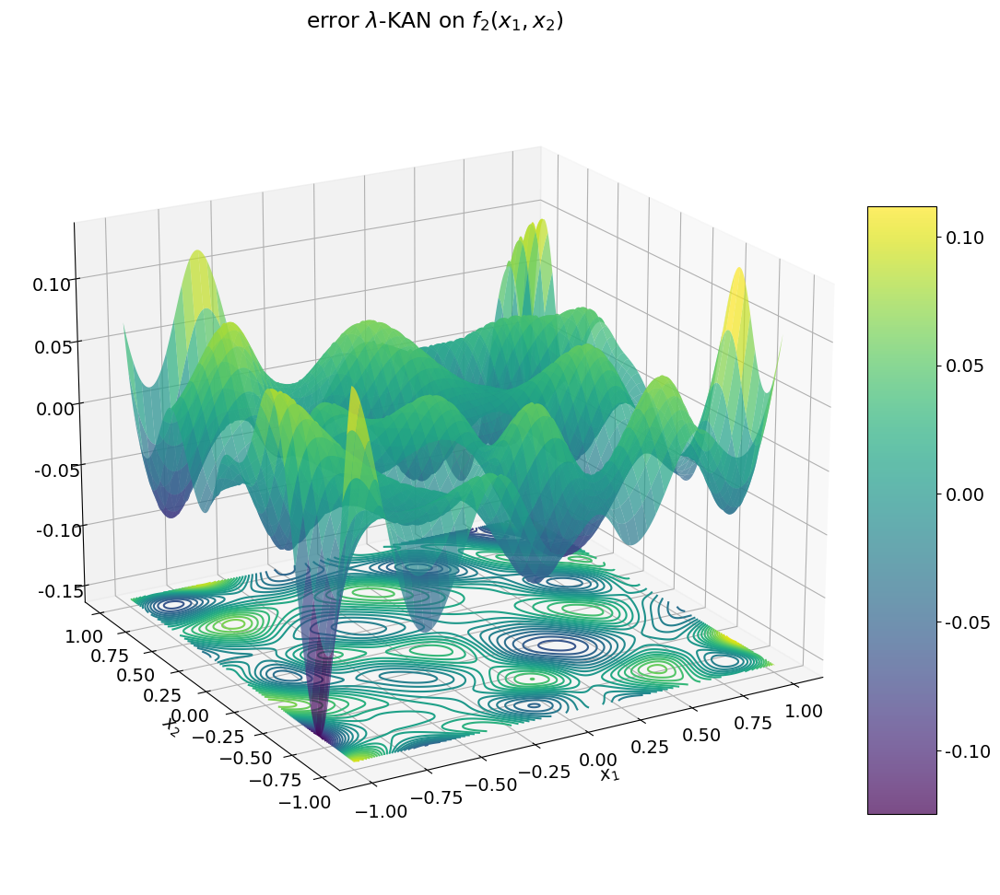

In [25]:
model_plot = lambda x: model(x).detach()
plot_f_3d(model_plot, title='$\lambda$-KAN on $f_2(x_1, x_2)$')

error_model_plot = lambda x: model(x).detach() - f(x)
plot_f_3d(error_model_plot, title='error $\lambda$-KAN on $f_2(x_1, x_2)$')